<a id="section-top"></a>
# Table of Contents
* [Introduction](#section-intro)
* [1) Unzip Datasets](#section-one)
* [2) Sample Images](#section-two)


* [3) VGG-16](#section-three)
    * [Paper](#section-three1)
    * [Architecture](#section-three2)
    * [Keras Implementation](#section-three3)
    

* [4) Data Preparation & Augmentation](#section-four)
    * [Sample Augmentation](#section-four1)
    

* [5) Pre-Trained VGG-16 Model & Transfer Learning](#section-five)
    * [Build Model](#section-five1)
    * [Callbacks](#section-five2)
    * [Fit](#section-five3)
    

* [6) Interpreting Results and Error Analysis](#section-six)
    * [Learning Curve](#section-six1)
    * [Confusion Matrix & Classification Report](#section-six2)
    * [Error Analysis](#section-six3)


* [7) Predict Test Set](#section-seven)


* [Conclusion](#section-conc)
* [Readings, Resources](#section-read)

<a id="section-intro"></a>

# Introduction

In this notebook, my main goal is;

- Implementing VGG-16 model from scratch with using Keras

- Transfer Learning with pre-trained VGG-16 model

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import random
import zipfile
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, classification_report 
import tensorflow as tf
from keras.preprocessing.image import load_img, ImageDataGenerator
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, GlobalAveragePooling2D, Dropout, BatchNormalization, Input
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.applications.vgg16 import VGG16, preprocess_input

batch_size = 128

In [2]:
seed = 666
tf.random.set_seed(seed)
np.random.seed(seed)
os.environ["PYTHONHASHSEED"] = str(seed)                      
random.seed(666)

[take me to the top](#section-top)

<a id="section-one"></a>

# 1) Unzip Datasets

In [3]:
os.listdir("../input/dogs-vs-cats/")

['test1.zip', 'train.zip', 'sampleSubmission.csv']

In [4]:
TRAIN_PATH = "../input/dogs-vs-cats/train.zip"
TEST_PATH = "../input/dogs-vs-cats/test1.zip"

FILES = "/kaggle/files/unzipped/"

with zipfile.ZipFile(TRAIN_PATH, 'r') as zipp:
    zipp.extractall(FILES)
    
with zipfile.ZipFile(TEST_PATH, 'r') as zipp:
    zipp.extractall(FILES)

In [5]:
train_df = pd.DataFrame({"file": os.listdir("/kaggle/files/unzipped/train")})
train_df["label"] = train_df["file"].apply(lambda x: x.split(".")[0])

train_df

,file,label
0,dog.890.jpg,dog
1,dog.1178.jpg,dog
2,dog.7845.jpg,dog
3,dog.4632.jpg,dog
4,cat.3660.jpg,cat
...,...,...
24995,dog.6505.jpg,dog
24996,cat.3805.jpg,cat
24997,cat.5513.jpg,cat
24998,cat.6808.jpg,cat


In [6]:
test_df = pd.DataFrame({"file": os.listdir("/kaggle/files/unzipped/test1")})

test_df.head()

,file
0,10435.jpg
1,6790.jpg
2,4644.jpg
3,1835.jpg
4,1102.jpg


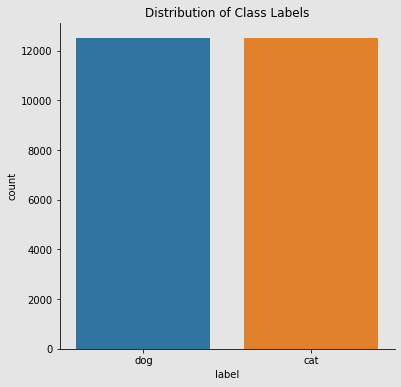

In [7]:
fig, ax = plt.subplots(figsize = (6, 6), facecolor = "#e5e5e5")
ax.set_facecolor("#e5e5e5")

sns.countplot(x = "label", data = train_df, ax = ax)

ax.set_title("Distribution of Class Labels")
sns.despine()
plt.show()

[take me to the top](#section-top)

<a id="section-two"></a>

# 2) Sample Images

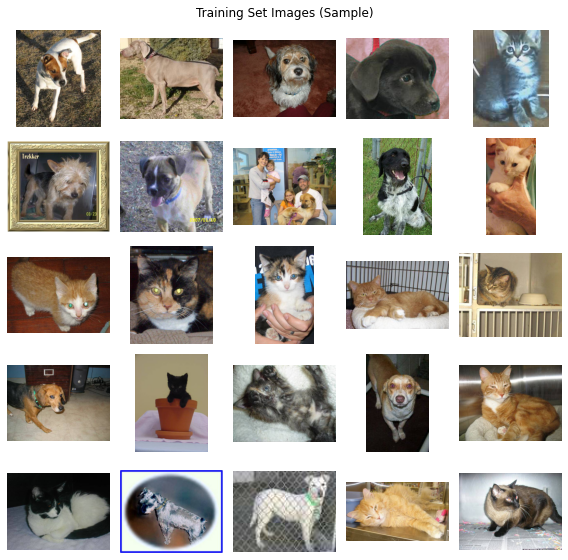

In [8]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Training Set Images (Sample)")

for i in range(25):

    plt.subplot(5, 5, i + 1)
    image = load_img(FILES + "train/" + train_df["file"][i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()

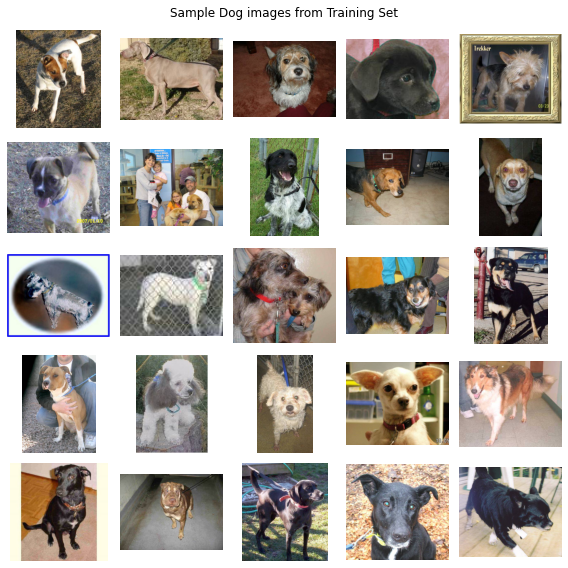

In [9]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Sample Dog images from Training Set")

for i in range(25):
    
    plt.subplot(5, 5, i + 1)
    image = load_img(FILES + "train/" + train_df.query("label == 'dog'").file.values[i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()

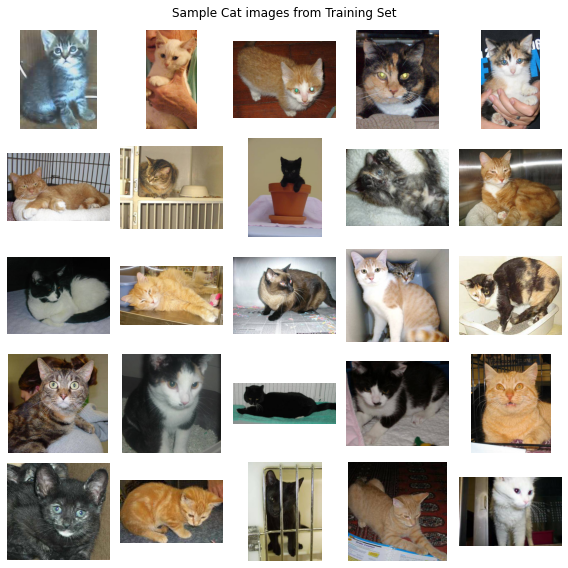

In [10]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Sample Cat images from Training Set")

for i in range(25):
    
    plt.subplot(5, 5, i + 1)
    image = load_img(FILES + "train/" + train_df.query("label == 'cat'").file.values[i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()

[take me to the top](#section-top)

<a id="section-three"></a>

# 3) VGG-16

<a id="section-three1"></a>

## Paper 

> In this work we investigate the effect of the convolutional network depth on its accuracy in the large-scale image recognition setting. Our main contribution is a thorough evaluation of networks of increasing depth using an architecture with very small (3x3) convolution filters, which shows that a significant improvement on the prior-art configurations can be achieved by pushing the depth to 16-19 weight layers. These findings were the basis of our ImageNet Challenge 2014 submission, where our team secured the first and the second places in the localisation and classification tracks respectively. We also show that our representations generalise well to other datasets, where they achieve state-of-the-art results. We have made our two best-performing ConvNet models publicly available to facilitate further research on the use of deep visual representations in computer vision.
> 

https://arxiv.org/abs/1409.1556

<a id="section-three2"></a>

## Architecture

![](https://miro.medium.com/max/2000/1*_vGloND6yyxFeFH5UyCDVg.png)

> *https://towardsdatascience.com/illustrated-10-cnn-architectures-95d78ace614d

VGG-16 has nearly 138M parameters. It is more than EfficientNet, ResNext, etc.

It also has 75% accuracy on ImageNet data, that is a poor result wrt other architectures.

<a id="section-three3"></a>

## Keras Implementation

In [11]:
def VGG_16(input_shape = (224, 224, 3), n_classes = 1000):
    
    model = Sequential(
        [
            Conv2D(filters = 64, kernel_size = (3, 3), padding = "same", activation = "relu", input_shape = input_shape),
            Conv2D(filters = 64, kernel_size = (3, 3), padding = "same", activation = "relu"),
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Conv2D(filters = 128, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 128, kernel_size = (3, 3), padding = "same", activation = "relu"),
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Conv2D(filters = 256, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 256, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 256, kernel_size = (3, 3), padding = "same", activation = "relu"),
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Flatten(),
            Dense(units = 4096, activation = "relu"),
            Dense(units = 4096, activation = "relu"),
            Dense(units = n_classes, activation = "softmax")
        ]
    )
    
    return model

[take me to the top](#section-top)

<a id="section-four"></a>

# 4) Data Preparation & Augmentation

In [12]:
train_data, val_data = train_test_split(train_df, 
                                        test_size = 0.2, 
                                        stratify = train_df["label"], 
                                        random_state = 666)

<a id="section-four1"></a>

## Sample Augmentation

Found 1 validated image filenames belonging to 1 classes.


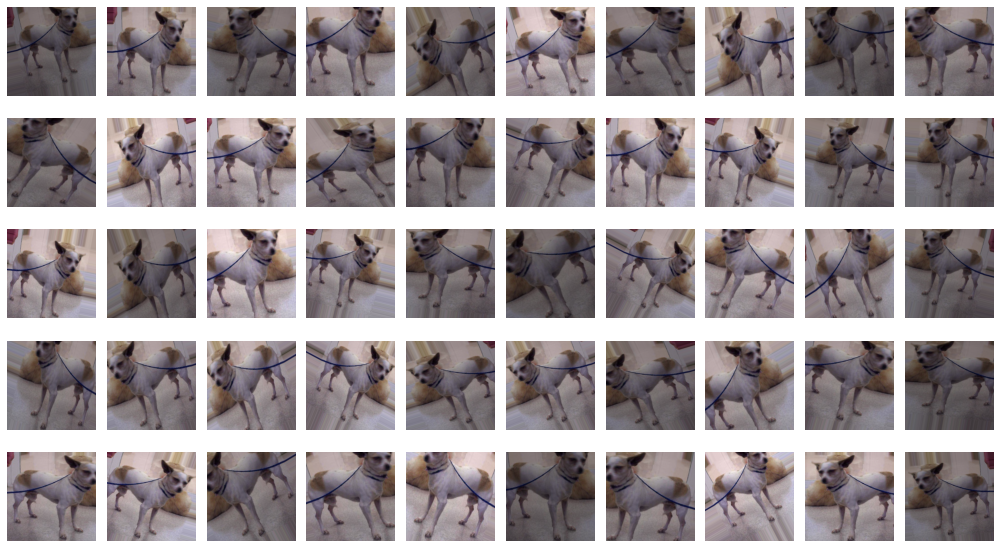

In [13]:
datagen = ImageDataGenerator(
    rotation_range = 30, 
    width_shift_range = 0.1,
    height_shift_range = 0.1, 
    brightness_range = (0.5, 1), 
    zoom_range = 0.2,
    horizontal_flip = True, 
    rescale = 1./255,
)

sample_df = train_data.sample(1)

sample_generator = datagen.flow_from_dataframe(
    dataframe = sample_df,
    directory = FILES + "train/",
    x_col = "file",
    y_col = "label",
    class_mode = "categorical",
    target_size = (224, 224),
    seed = 666
)

plt.figure(figsize = (14, 8))

for i in range(50):
    
    plt.subplot(5, 10, i + 1)
    
    for X, y in sample_generator:

        plt.imshow(X[0])
        plt.axis("off")
        break
        
plt.tight_layout()
plt.show()

I just set simple options for generation. More options increase training time and we probably wait more until model converge.

In [14]:
train_datagen = ImageDataGenerator(
    rotation_range = 15, 
#     width_shift_range = 0.1,
#     height_shift_range = 0.1, 
#     brightness_range = (0.5, 1), 
#     zoom_range = 0.1,
    horizontal_flip = True,
    preprocessing_function = preprocess_input
)

val_datagen = ImageDataGenerator(preprocessing_function = preprocess_input)

In [15]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe = train_data,
    directory = FILES + "train/",
    x_col = "file",
    y_col = "label",
    class_mode = "categorical",
    target_size = (224, 224),
    batch_size = batch_size,
    seed = 666,
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe = val_data,
    directory = FILES + "train/",
    x_col = "file",
    y_col = "label",
    class_mode = "categorical",
    target_size = (224, 224),
    batch_size = batch_size,
    seed = 666,
    shuffle = False
)

Found 20000 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


[take me to the top](#section-top)

<a id="section-five"></a>

# 5) Pre-Trained VGG-16 Model & Transfer Learning

<a id="section-five1"></a>
## Build Model

In [16]:
base_model = VGG16(
    weights = "imagenet", 
    input_shape = (224, 224, 3),
    include_top = False
)


for layers in base_model.layers:
    layers.trainable = False


def vgg16_pretrained():
    
    model = Sequential(
        [
            base_model,
            GlobalAveragePooling2D(),
            Dense(100, activation = "relu"),
            Dropout(0.4),
            Dense(64, activation = "relu"),
            Dense(2, activation = "softmax")
        ]
    )
    
    return model

tf.keras.backend.clear_session()

2021-11-28 09:28:31.389438: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-28 09:28:31.522708: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-28 09:28:31.523820: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-28 09:28:31.525705: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

58900480/58889256 [==============================] - 2s 0us/step


In [17]:
model = vgg16_pretrained()

model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = "accuracy")

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 100)               51300     
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                6464      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 130       
Total params: 14,772,582
Trainable params: 57,894
Non-trainable params: 14,714,688
_______________________________________

<a id="section-five2"></a>

## Callbacks

In [18]:
reduce_lr = ReduceLROnPlateau(
    monitor = "val_accuracy", 
    patience = 2,
    verbose = 1, 
    factor = 0.5, 
    min_lr = 0.000000001
)

early_stopping = EarlyStopping(
    monitor = "val_accuracy",
    patience = 5,
    verbose = 1,
    mode = "max",
)

checkpoint = ModelCheckpoint(
    monitor = "val_accuracy",
    filepath = "catdog_vgg16_.{epoch:02d}-{val_accuracy:.6f}.hdf5",
    verbose = 1,
    save_best_only = True, 
    save_weights_only = True
)

<a id="section-five3"></a>

## Fit

In [19]:
history = model.fit(
    train_generator,
    epochs = 10, 
    validation_data = val_generator,
    validation_steps = val_data.shape[0] // batch_size,
    steps_per_epoch = train_data.shape[0] // batch_size,
    callbacks = [reduce_lr, early_stopping, checkpoint]
)

2021-11-28 09:28:40.104471: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/10


2021-11-28 09:28:44.034679: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


156/156 [==============================] - 313s 2s/step - loss: 0.1620 - accuracy: 0.9509 - val_loss: 0.0763 - val_accuracy: 0.9770

Epoch 00001: val_accuracy improved from -inf to 0.97696, saving model to catdog_vgg16_.01-0.976963.hdf5
Epoch 2/10
156/156 [==============================] - 299s 2s/step - loss: 0.0730 - accuracy: 0.9731 - val_loss: 0.0692 - val_accuracy: 0.9806

Epoch 00002: val_accuracy improved from 0.97696 to 0.98057, saving model to catdog_vgg16_.02-0.980569.hdf5
Epoch 3/10
156/156 [==============================] - 299s 2s/step - loss: 0.0615 - accuracy: 0.9770 - val_loss: 0.0614 - val_accuracy: 0.9800

Epoch 00003: val_accuracy did not improve from 0.98057
Epoch 4/10
156/156 [==============================] - 299s 2s/step - loss: 0.0535 - accuracy: 0.9805 - val_loss: 0.0583 - val_accuracy: 0.9810

Epoch 00004: val_accuracy improved from 0.98057 to 0.98097, saving model to catdog_vgg16_.04-0.980970.hdf5
Epoch 5/10
156/156 [==============================] - 298s 2s/

[take me to the top](#section-top)

I didn't use excessive data augmentation or I didn't set large epochs for concerning time. In this notebook, score is not main goal.

In [20]:
tf.keras.backend.clear_session()

model = vgg16_pretrained()

model.load_weights("./catdog_vgg16_.10-0.983774.hdf5")

<a id="section-six"></a>

# 6) Interpreting Results and Error Analysis

<a id="section-six1"></a>

## Learning Curve 

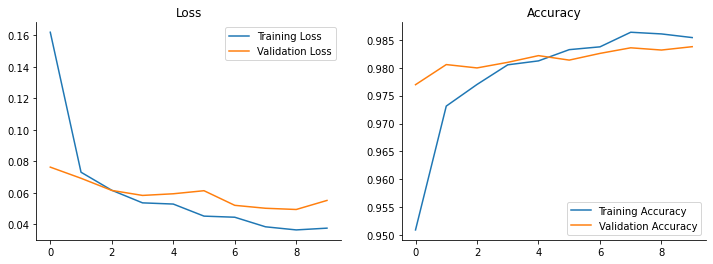

In [21]:
fig, axes = plt.subplots(1, 2, figsize = (12, 4))

sns.lineplot(x = range(len(history.history["loss"])), y = history.history["loss"], ax = axes[0], label = "Training Loss")
sns.lineplot(x = range(len(history.history["loss"])), y = history.history["val_loss"], ax = axes[0], label = "Validation Loss")

sns.lineplot(x = range(len(history.history["accuracy"])), y = history.history["accuracy"], ax = axes[1], label = "Training Accuracy")
sns.lineplot(x = range(len(history.history["accuracy"])), y = history.history["val_accuracy"], ax = axes[1], label = "Validation Accuracy")
axes[0].set_title("Loss"); axes[1].set_title("Accuracy")

sns.despine()
plt.show()

In [22]:
val_pred = model.predict(val_generator, steps = np.ceil(val_data.shape[0] / batch_size))
val_data.loc[:, "val_pred"] = np.argmax(val_pred, axis = 1)

labels = dict((v, k) for k, v in val_generator.class_indices.items())

val_data.loc[:, "val_pred"] = val_data.loc[:, "val_pred"].map(labels)

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [23]:
labels

{0: 'cat', 1: 'dog'}

[take me to the top](#section-top)

<a id="section-six2"></a>
## Confusion Matrix & Classification Report

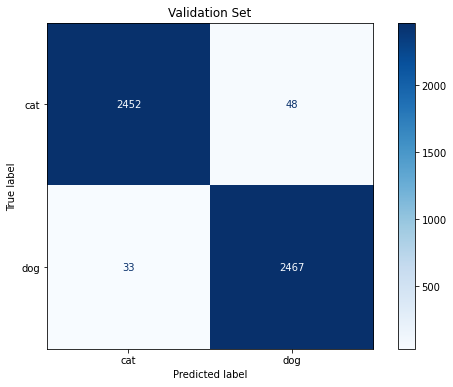

In [24]:
fig, ax = plt.subplots(figsize = (9, 6))

cm = confusion_matrix(val_data["label"], val_data["val_pred"])

disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ["cat", "dog"])
disp.plot(cmap = plt.cm.Blues, ax = ax)

ax.set_title("Validation Set")
plt.show()

In [25]:
print(classification_report(val_data["label"], val_data["val_pred"]))

              precision    recall  f1-score   support

         cat       0.99      0.98      0.98      2500
         dog       0.98      0.99      0.98      2500

    accuracy                           0.98      5000
   macro avg       0.98      0.98      0.98      5000
weighted avg       0.98      0.98      0.98      5000



<a id="section-six3"></a>
## Error Analysis

In [26]:
val_errors = val_data[(val_data.label) != (val_data.val_pred)].reset_index(drop = True)
val_errors

,file,label,val_pred
0,cat.1011.jpg,cat,dog
1,dog.6489.jpg,dog,cat
2,dog.3035.jpg,dog,cat
3,dog.11713.jpg,dog,cat
4,cat.8717.jpg,cat,dog
...,...,...,...
76,dog.8117.jpg,dog,cat
77,cat.9882.jpg,cat,dog
78,cat.7968.jpg,cat,dog
79,cat.8470.jpg,cat,dog


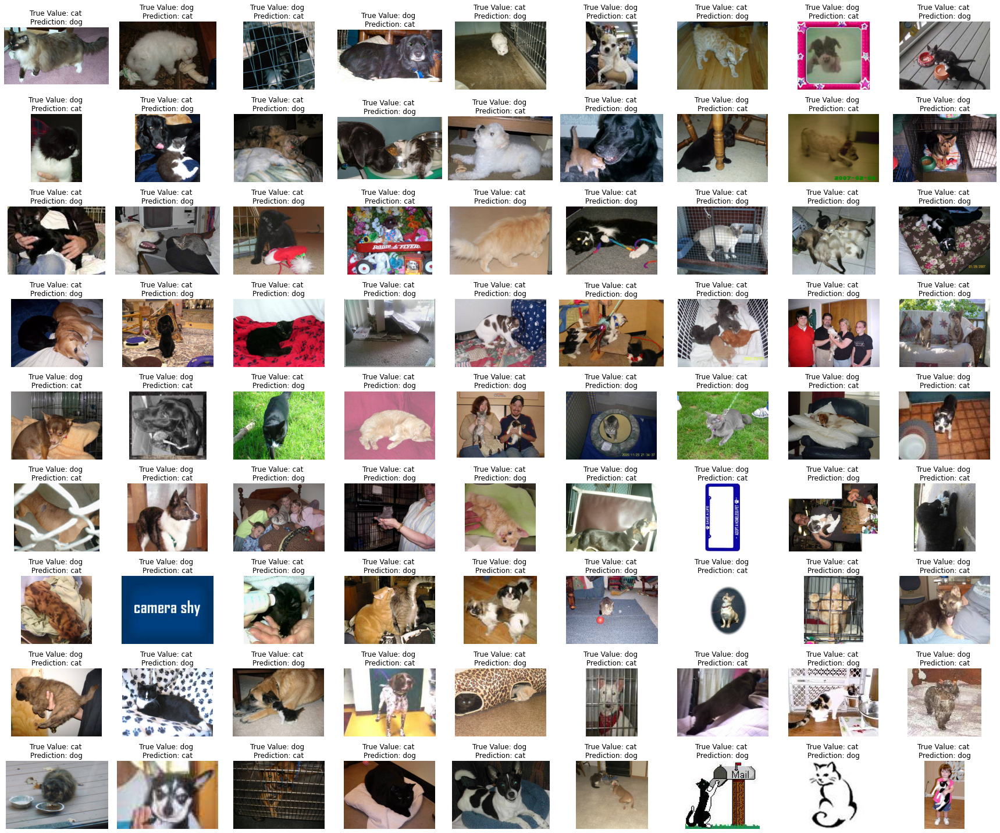

In [27]:
fig = plt.figure(1, figsize = (24, 20))

for i in range(81):
    
    plt.subplot(9, 9, i + 1)
    image = load_img("/kaggle/files/unzipped/train/" + val_errors.file[i])
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"True Value: {val_errors['label'][i]} \nPrediction: {val_errors['val_pred'][i]}")    
    
plt.tight_layout()
plt.show()

[take me to the top](#section-top)

<a id="section-seven"></a>
# 7) Predict Test Set

In [28]:
test_datagen = ImageDataGenerator(preprocessing_function = preprocess_input)

test_generator = test_datagen.flow_from_dataframe(
    dataframe = test_df,
    directory = FILES + "test1/",
    x_col = "file",
    y_col = None,
    class_mode = None,
    target_size = (224, 224),
    batch_size = batch_size,
    seed = 666,
    shuffle = False
)

Found 12500 validated image filenames.


In [29]:
test_preds = model.predict(test_generator, steps = np.ceil(test_df.shape[0] / batch_size))

test_df["test_preds"] = np.argmax(test_preds, axis = 1)
labels = dict((v,k) for k,v in train_generator.class_indices.items())

test_df['test_preds'] = test_df['test_preds'].map(labels)

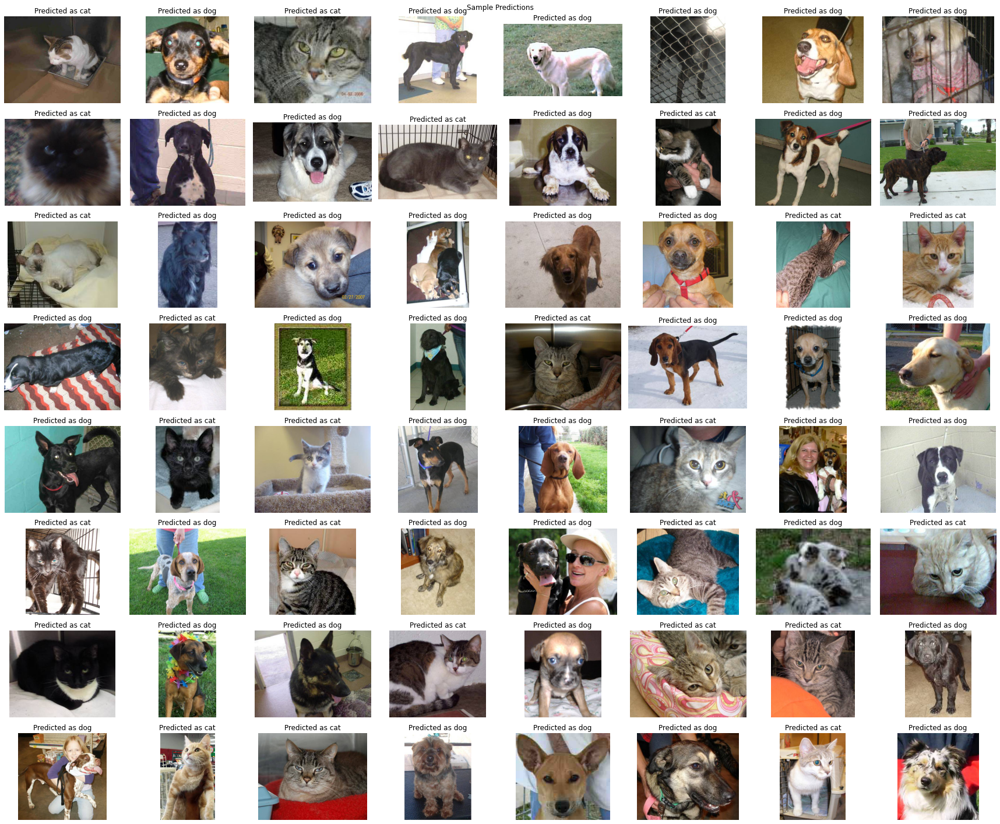

In [30]:
sample_test = test_df.sample(64).reset_index(drop = True)

fig = plt.figure(1, figsize = (24, 20))
fig.suptitle("Sample Predictions")

for i in range(len(sample_test)):
    
    plt.subplot(8, 8, i + 1)
    image = load_img("/kaggle/files/unzipped/test1/" + sample_test.file[i])
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Predicted as {sample_test['test_preds'][i]}")
    
plt.tight_layout()
plt.show()

<a id="section-conc"></a>
# Conclusion

There are lots of architectures about image classification and you can easily reach their trained parameters. You can use that parameters for transfer learning and fine tuning. You don't need to know an algorithm's architecture, but having knowledge about architectures and reading its papers probably gives you an advantage.


Also, I saw lots of notebook about this topic with a few upvotes and much more forks. Please upvote notebooks if you find it useful.

<a id="section-read"></a>

# Readings, Resources

https://towardsdatascience.com/illustrated-10-cnn-architectures-95d78ace614d#c5a6

https://keras.io/guides/transfer_learning/

https://paperswithcode.com/sota/image-classification-on-imagenet

https://viso.ai/deep-learning/vgg-very-deep-convolutional-networks/

https://medium.com/mini-distill/effect-of-batch-size-on-training-dynamics-21c14f7a716e

https://ai.stackexchange.com/a/4413

https://www.kaggle.com/rajmehra03/a-comprehensive-guide-to-transfer-learning

https://www.kaggle.com/dansbecker/transfer-learning


Good notebooks about this dataset

https://www.kaggle.com/uysimty/keras-cnn-dog-or-cat-classification

https://www.kaggle.com/bhuvanchennoju/hey-siri-is-it-a-or-class-f1-0-992


You can also look at

https://www.kaggle.com/mustafacicek/mnist-cnn-data-augmentation